# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""

import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

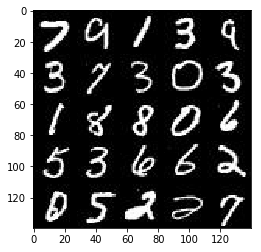

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

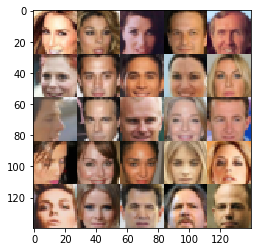

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [3]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [4]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    
    inputs_real = tf.placeholder(tf.float32,(None,image_width,image_height,image_channels),name="inputs_real")
    inputs_z = tf.placeholder(tf.float32,(None,z_dim))
    learning_rate = tf.placeholder(tf.float32,())
    

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [5]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    #print(images.shape)
    with tf.variable_scope('discriminator' ,reuse=reuse):
        # Input layer is ?x28x28x1 for MNIST
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 28x28x1x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 14x14x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 7x7x256

        # Flatten it
        # 注意这里的layer.dense的activation要专门设为None，否则默认为别的
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1,activation=None)
        out = tf.sigmoid(logits)
        #print(out.shape,logits.shape)
        
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [6]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2

    with tf.variable_scope('generator', reuse= not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 2*2*512)
            
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training= is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 2*2*512

        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training= is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 7*7*256
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training= is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14*14*128

        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 28*28*out_channel

        out = tf.tanh(logits)

    return out

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function

    g_model = generator(input_z, out_channel_dim, is_train= True)
    d_model_real, d_logits_real = discriminator(input_real, reuse= False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse= True)
    
    # 17/09/19 add real lable smoothing to prevent the discriminator from overfitting
    smooth = 0.1
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,\
                                                                         labels=tf.ones_like(d_model_real)*(1-smooth)))
                                 
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
#def train(epochs,      batch_size, z_size,learning_rate, beta1, dataset,     real_size
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model

    # GAN
    class GAN:
        def __init__(self, data_shape, z_dim, learning_rate, alpha=0.2, beta1=0.5):
            #tf.reset_default_graph() 注释之后不会出现index out of list的错误

            self.input_real, self.input_z, _ = model_inputs(data_shape[1], data_shape[2],data_shape[3], z_dim)

            self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z, data_shape[3])

            self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)
    
    # initialize
    net = GAN(data_shape, z_dim, learning_rate, alpha=0.2, beta1=beta1)
    samples, losses = [], []
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                
                # normalize
                batch_images = batch_images * 2

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # loss
                # model_loss(input_real, input_z, out_channel_dim) return d_loss, g_loss
                
                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: batch_images, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: batch_images})
                
                
                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: batch_images})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % 100 == 0:
                    show_generator_output(sess, 64, net.input_z, data_shape[3], data_image_mode)
                
    return losses, samples   


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 2.0156... Generator Loss: 0.2544
Epoch 1/2... Discriminator Loss: 1.0459... Generator Loss: 0.7717
Epoch 1/2... Discriminator Loss: 3.7600... Generator Loss: 0.0386
Epoch 1/2... Discriminator Loss: 1.2048... Generator Loss: 4.4366
Epoch 1/2... Discriminator Loss: 2.2107... Generator Loss: 0.2008
Epoch 1/2... Discriminator Loss: 0.9213... Generator Loss: 0.9132
Epoch 1/2... Discriminator Loss: 1.7037... Generator Loss: 7.2676
Epoch 1/2... Discriminator Loss: 1.2518... Generator Loss: 0.7606
Epoch 1/2... Discriminator Loss: 0.5878... Generator Loss: 2.3547
Epoch 1/2... Discriminator Loss: 0.6697... Generator Loss: 1.9788


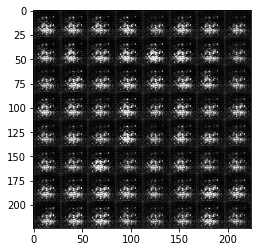

Epoch 1/2... Discriminator Loss: 0.6455... Generator Loss: 1.9839
Epoch 1/2... Discriminator Loss: 0.5883... Generator Loss: 2.1286
Epoch 1/2... Discriminator Loss: 0.6925... Generator Loss: 1.5247
Epoch 1/2... Discriminator Loss: 0.4408... Generator Loss: 3.3691
Epoch 1/2... Discriminator Loss: 0.4717... Generator Loss: 2.6491
Epoch 1/2... Discriminator Loss: 0.4723... Generator Loss: 2.8623
Epoch 1/2... Discriminator Loss: 0.4823... Generator Loss: 3.1265
Epoch 1/2... Discriminator Loss: 0.4427... Generator Loss: 3.5494
Epoch 1/2... Discriminator Loss: 0.5306... Generator Loss: 2.7037
Epoch 1/2... Discriminator Loss: 0.4927... Generator Loss: 3.0441


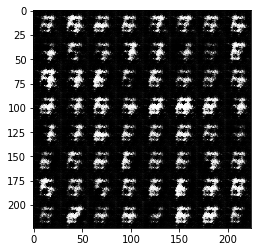

Epoch 1/2... Discriminator Loss: 0.5741... Generator Loss: 2.0628
Epoch 1/2... Discriminator Loss: 0.5934... Generator Loss: 2.2038
Epoch 1/2... Discriminator Loss: 0.4708... Generator Loss: 2.8729
Epoch 1/2... Discriminator Loss: 0.4795... Generator Loss: 3.6211
Epoch 1/2... Discriminator Loss: 0.4717... Generator Loss: 2.9475
Epoch 1/2... Discriminator Loss: 0.8669... Generator Loss: 1.3108
Epoch 1/2... Discriminator Loss: 0.5484... Generator Loss: 2.3721
Epoch 1/2... Discriminator Loss: 0.7159... Generator Loss: 1.6829
Epoch 1/2... Discriminator Loss: 0.5608... Generator Loss: 2.5819
Epoch 1/2... Discriminator Loss: 1.4806... Generator Loss: 5.2732


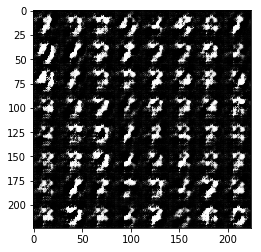

Epoch 1/2... Discriminator Loss: 0.5784... Generator Loss: 2.5252
Epoch 1/2... Discriminator Loss: 0.5611... Generator Loss: 2.7854
Epoch 1/2... Discriminator Loss: 0.7945... Generator Loss: 1.4607
Epoch 1/2... Discriminator Loss: 0.9026... Generator Loss: 2.4242
Epoch 1/2... Discriminator Loss: 0.9655... Generator Loss: 1.0395
Epoch 1/2... Discriminator Loss: 0.9721... Generator Loss: 1.9498
Epoch 1/2... Discriminator Loss: 1.1180... Generator Loss: 2.8018
Epoch 1/2... Discriminator Loss: 0.7828... Generator Loss: 1.5598
Epoch 1/2... Discriminator Loss: 0.7736... Generator Loss: 1.3846
Epoch 1/2... Discriminator Loss: 0.9419... Generator Loss: 1.0307


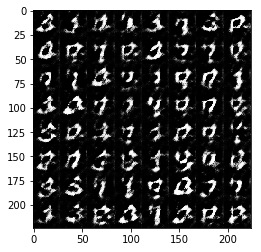

Epoch 1/2... Discriminator Loss: 0.9367... Generator Loss: 2.6416
Epoch 1/2... Discriminator Loss: 0.8159... Generator Loss: 1.8128
Epoch 1/2... Discriminator Loss: 0.8798... Generator Loss: 2.5949
Epoch 1/2... Discriminator Loss: 0.9176... Generator Loss: 1.2144
Epoch 1/2... Discriminator Loss: 0.7219... Generator Loss: 1.8483
Epoch 1/2... Discriminator Loss: 0.8059... Generator Loss: 2.3862
Epoch 1/2... Discriminator Loss: 0.7727... Generator Loss: 3.4479
Epoch 1/2... Discriminator Loss: 0.9222... Generator Loss: 2.5848
Epoch 1/2... Discriminator Loss: 1.0630... Generator Loss: 2.8734
Epoch 1/2... Discriminator Loss: 0.6266... Generator Loss: 2.2430


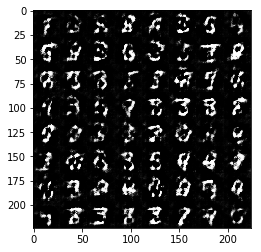

Epoch 1/2... Discriminator Loss: 0.8065... Generator Loss: 2.6831
Epoch 1/2... Discriminator Loss: 0.7041... Generator Loss: 1.6547
Epoch 1/2... Discriminator Loss: 0.8858... Generator Loss: 2.3159
Epoch 1/2... Discriminator Loss: 0.8180... Generator Loss: 2.5833
Epoch 1/2... Discriminator Loss: 0.9781... Generator Loss: 0.9468
Epoch 1/2... Discriminator Loss: 0.8865... Generator Loss: 1.0754
Epoch 1/2... Discriminator Loss: 0.7800... Generator Loss: 1.6625
Epoch 1/2... Discriminator Loss: 0.9489... Generator Loss: 0.9634
Epoch 1/2... Discriminator Loss: 0.9725... Generator Loss: 1.0020
Epoch 1/2... Discriminator Loss: 1.0773... Generator Loss: 0.8485


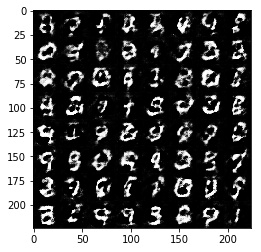

Epoch 1/2... Discriminator Loss: 1.0239... Generator Loss: 2.5571
Epoch 1/2... Discriminator Loss: 0.9015... Generator Loss: 1.2276
Epoch 1/2... Discriminator Loss: 0.9753... Generator Loss: 1.2053
Epoch 1/2... Discriminator Loss: 1.0057... Generator Loss: 2.1926
Epoch 1/2... Discriminator Loss: 0.8465... Generator Loss: 1.6048
Epoch 1/2... Discriminator Loss: 1.0084... Generator Loss: 1.9444
Epoch 1/2... Discriminator Loss: 0.9173... Generator Loss: 1.4627
Epoch 1/2... Discriminator Loss: 0.8078... Generator Loss: 2.3019
Epoch 1/2... Discriminator Loss: 0.8268... Generator Loss: 1.6584
Epoch 1/2... Discriminator Loss: 1.1176... Generator Loss: 2.3888


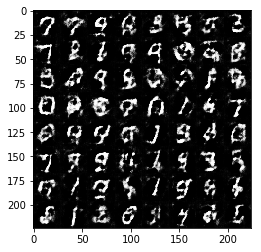

Epoch 1/2... Discriminator Loss: 1.3557... Generator Loss: 0.5416
Epoch 1/2... Discriminator Loss: 1.0322... Generator Loss: 0.9299
Epoch 1/2... Discriminator Loss: 0.9745... Generator Loss: 1.6227
Epoch 1/2... Discriminator Loss: 0.9818... Generator Loss: 0.9367
Epoch 1/2... Discriminator Loss: 0.8268... Generator Loss: 1.4640
Epoch 1/2... Discriminator Loss: 1.1665... Generator Loss: 2.6848
Epoch 1/2... Discriminator Loss: 1.2037... Generator Loss: 0.6577
Epoch 1/2... Discriminator Loss: 0.8942... Generator Loss: 2.3882
Epoch 1/2... Discriminator Loss: 1.1888... Generator Loss: 0.7099
Epoch 1/2... Discriminator Loss: 0.9653... Generator Loss: 2.1846


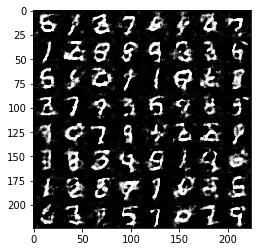

Epoch 1/2... Discriminator Loss: 0.8720... Generator Loss: 2.0316
Epoch 1/2... Discriminator Loss: 0.8519... Generator Loss: 1.4014
Epoch 1/2... Discriminator Loss: 0.9436... Generator Loss: 1.8623
Epoch 1/2... Discriminator Loss: 0.9530... Generator Loss: 1.0578
Epoch 1/2... Discriminator Loss: 0.8496... Generator Loss: 1.4546
Epoch 1/2... Discriminator Loss: 1.1431... Generator Loss: 2.5723
Epoch 1/2... Discriminator Loss: 1.0887... Generator Loss: 0.8163
Epoch 1/2... Discriminator Loss: 0.9237... Generator Loss: 1.3319
Epoch 1/2... Discriminator Loss: 0.8929... Generator Loss: 1.4335
Epoch 1/2... Discriminator Loss: 0.8957... Generator Loss: 1.1222


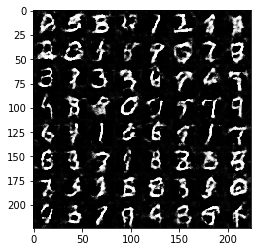

Epoch 1/2... Discriminator Loss: 0.9441... Generator Loss: 1.5147
Epoch 1/2... Discriminator Loss: 0.8670... Generator Loss: 1.0787
Epoch 1/2... Discriminator Loss: 1.1061... Generator Loss: 0.7310
Epoch 2/2... Discriminator Loss: 1.0901... Generator Loss: 0.7730
Epoch 2/2... Discriminator Loss: 1.0390... Generator Loss: 0.8645
Epoch 2/2... Discriminator Loss: 0.8555... Generator Loss: 1.2785
Epoch 2/2... Discriminator Loss: 0.9501... Generator Loss: 0.9493
Epoch 2/2... Discriminator Loss: 0.8995... Generator Loss: 1.3182
Epoch 2/2... Discriminator Loss: 1.1033... Generator Loss: 0.7692
Epoch 2/2... Discriminator Loss: 1.5942... Generator Loss: 0.4125


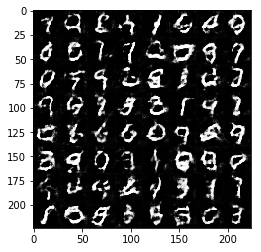

Epoch 2/2... Discriminator Loss: 0.8633... Generator Loss: 1.5013
Epoch 2/2... Discriminator Loss: 1.0068... Generator Loss: 0.8843
Epoch 2/2... Discriminator Loss: 1.1295... Generator Loss: 0.7673
Epoch 2/2... Discriminator Loss: 1.0134... Generator Loss: 0.9013
Epoch 2/2... Discriminator Loss: 0.9224... Generator Loss: 1.1032
Epoch 2/2... Discriminator Loss: 1.0555... Generator Loss: 1.0533
Epoch 2/2... Discriminator Loss: 0.9155... Generator Loss: 1.1148
Epoch 2/2... Discriminator Loss: 1.0899... Generator Loss: 0.7633
Epoch 2/2... Discriminator Loss: 0.9576... Generator Loss: 1.2368
Epoch 2/2... Discriminator Loss: 1.0094... Generator Loss: 1.5777


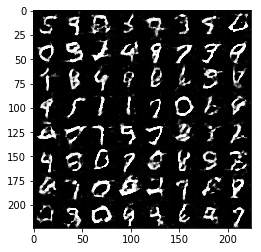

Epoch 2/2... Discriminator Loss: 1.0625... Generator Loss: 0.8151
Epoch 2/2... Discriminator Loss: 0.9546... Generator Loss: 1.4318
Epoch 2/2... Discriminator Loss: 0.9876... Generator Loss: 1.1142
Epoch 2/2... Discriminator Loss: 1.0120... Generator Loss: 1.6506
Epoch 2/2... Discriminator Loss: 0.9484... Generator Loss: 0.9795
Epoch 2/2... Discriminator Loss: 0.8997... Generator Loss: 1.5910
Epoch 2/2... Discriminator Loss: 1.0111... Generator Loss: 1.8246
Epoch 2/2... Discriminator Loss: 1.1097... Generator Loss: 2.1781
Epoch 2/2... Discriminator Loss: 1.0731... Generator Loss: 0.7941
Epoch 2/2... Discriminator Loss: 1.2399... Generator Loss: 0.6644


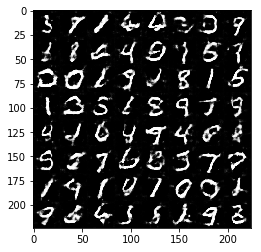

Epoch 2/2... Discriminator Loss: 0.8694... Generator Loss: 1.2927
Epoch 2/2... Discriminator Loss: 0.9892... Generator Loss: 1.6523
Epoch 2/2... Discriminator Loss: 0.9828... Generator Loss: 0.9725
Epoch 2/2... Discriminator Loss: 0.9404... Generator Loss: 0.9009
Epoch 2/2... Discriminator Loss: 1.4979... Generator Loss: 0.4242
Epoch 2/2... Discriminator Loss: 0.8275... Generator Loss: 1.4795
Epoch 2/2... Discriminator Loss: 0.9146... Generator Loss: 1.0513
Epoch 2/2... Discriminator Loss: 0.9408... Generator Loss: 1.8136
Epoch 2/2... Discriminator Loss: 1.7158... Generator Loss: 0.3591
Epoch 2/2... Discriminator Loss: 0.9175... Generator Loss: 1.2047


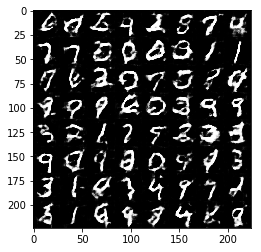

Epoch 2/2... Discriminator Loss: 0.9483... Generator Loss: 0.9495
Epoch 2/2... Discriminator Loss: 0.9195... Generator Loss: 0.9704
Epoch 2/2... Discriminator Loss: 0.8858... Generator Loss: 1.0977
Epoch 2/2... Discriminator Loss: 0.9215... Generator Loss: 1.7332
Epoch 2/2... Discriminator Loss: 0.8793... Generator Loss: 1.1514
Epoch 2/2... Discriminator Loss: 0.9737... Generator Loss: 0.8546
Epoch 2/2... Discriminator Loss: 0.8357... Generator Loss: 1.1144
Epoch 2/2... Discriminator Loss: 1.0095... Generator Loss: 0.8579
Epoch 2/2... Discriminator Loss: 0.9045... Generator Loss: 1.0292
Epoch 2/2... Discriminator Loss: 1.2053... Generator Loss: 0.6169


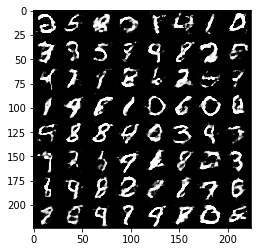

Epoch 2/2... Discriminator Loss: 0.9428... Generator Loss: 1.1502
Epoch 2/2... Discriminator Loss: 0.8792... Generator Loss: 1.0899
Epoch 2/2... Discriminator Loss: 0.9143... Generator Loss: 1.2167
Epoch 2/2... Discriminator Loss: 1.3191... Generator Loss: 0.5608
Epoch 2/2... Discriminator Loss: 1.0512... Generator Loss: 0.7532
Epoch 2/2... Discriminator Loss: 0.8349... Generator Loss: 1.2396
Epoch 2/2... Discriminator Loss: 1.1354... Generator Loss: 0.7395
Epoch 2/2... Discriminator Loss: 0.8362... Generator Loss: 1.1250
Epoch 2/2... Discriminator Loss: 0.9152... Generator Loss: 1.1708
Epoch 2/2... Discriminator Loss: 0.7985... Generator Loss: 1.1938


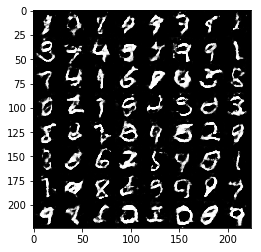

Epoch 2/2... Discriminator Loss: 0.9212... Generator Loss: 0.9490
Epoch 2/2... Discriminator Loss: 1.0623... Generator Loss: 0.8325
Epoch 2/2... Discriminator Loss: 0.8348... Generator Loss: 1.1010
Epoch 2/2... Discriminator Loss: 0.8136... Generator Loss: 1.1629
Epoch 2/2... Discriminator Loss: 0.8786... Generator Loss: 1.0183
Epoch 2/2... Discriminator Loss: 1.0129... Generator Loss: 0.8378
Epoch 2/2... Discriminator Loss: 1.1273... Generator Loss: 0.7281
Epoch 2/2... Discriminator Loss: 0.8280... Generator Loss: 1.2237
Epoch 2/2... Discriminator Loss: 0.7574... Generator Loss: 1.3319
Epoch 2/2... Discriminator Loss: 1.0102... Generator Loss: 0.8402


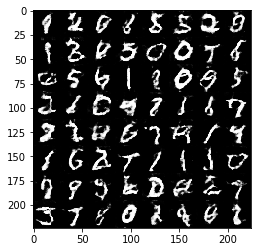

Epoch 2/2... Discriminator Loss: 0.9029... Generator Loss: 1.0453
Epoch 2/2... Discriminator Loss: 1.2682... Generator Loss: 0.5520
Epoch 2/2... Discriminator Loss: 0.7467... Generator Loss: 1.2850
Epoch 2/2... Discriminator Loss: 0.9000... Generator Loss: 1.9713
Epoch 2/2... Discriminator Loss: 1.4393... Generator Loss: 0.5635
Epoch 2/2... Discriminator Loss: 0.8679... Generator Loss: 1.2300
Epoch 2/2... Discriminator Loss: 0.8789... Generator Loss: 1.0397
Epoch 2/2... Discriminator Loss: 0.8078... Generator Loss: 1.2070
Epoch 2/2... Discriminator Loss: 0.7444... Generator Loss: 1.4730
Epoch 2/2... Discriminator Loss: 0.7213... Generator Loss: 1.3115


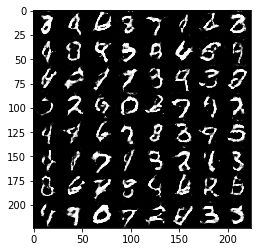

Epoch 2/2... Discriminator Loss: 1.1121... Generator Loss: 0.7509
Epoch 2/2... Discriminator Loss: 0.9050... Generator Loss: 0.9562
Epoch 2/2... Discriminator Loss: 0.7704... Generator Loss: 1.4730
Epoch 2/2... Discriminator Loss: 0.7998... Generator Loss: 1.2091
Epoch 2/2... Discriminator Loss: 0.9614... Generator Loss: 0.9013
Epoch 2/2... Discriminator Loss: 0.8087... Generator Loss: 1.1716
Epoch 2/2... Discriminator Loss: 0.8235... Generator Loss: 1.1680
Epoch 2/2... Discriminator Loss: 0.7535... Generator Loss: 1.2588
Epoch 2/2... Discriminator Loss: 0.8135... Generator Loss: 1.3389
Epoch 2/2... Discriminator Loss: 0.9985... Generator Loss: 0.9721


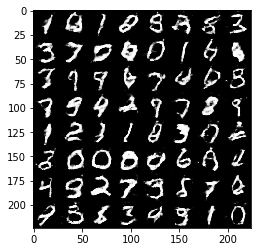

Epoch 2/2... Discriminator Loss: 0.9184... Generator Loss: 1.6565
Epoch 2/2... Discriminator Loss: 1.0240... Generator Loss: 0.8074
Epoch 2/2... Discriminator Loss: 0.8971... Generator Loss: 1.1459
Epoch 2/2... Discriminator Loss: 0.8936... Generator Loss: 0.9983
Epoch 2/2... Discriminator Loss: 0.8293... Generator Loss: 1.1520
Epoch 2/2... Discriminator Loss: 1.1067... Generator Loss: 0.7523
Epoch 2/2... Discriminator Loss: 1.0085... Generator Loss: 0.8800


In [ ]:
batch_size = 64
z_dim = 128
learning_rate = 0.0002
beta1 = 0.4
# (alpha = 0.2)
# (64,128,0.01,0.5,0.2) = 0.0215/5.030 完全是乱码

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

#### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.8596... Generator Loss: 1.8037
Epoch 1/1... Discriminator Loss: 0.6218... Generator Loss: 3.8139
Epoch 1/1... Discriminator Loss: 0.9137... Generator Loss: 0.9151
Epoch 1/1... Discriminator Loss: 0.4078... Generator Loss: 5.0994
Epoch 1/1... Discriminator Loss: 0.6210... Generator Loss: 1.9564
Epoch 1/1... Discriminator Loss: 2.2682... Generator Loss: 0.1839
Epoch 1/1... Discriminator Loss: 0.6818... Generator Loss: 1.7243
Epoch 1/1... Discriminator Loss: 1.4817... Generator Loss: 0.4458
Epoch 1/1... Discriminator Loss: 0.6516... Generator Loss: 2.0920
Epoch 1/1... Discriminator Loss: 0.6225... Generator Loss: 2.0116


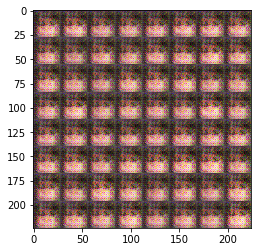

Epoch 1/1... Discriminator Loss: 0.7778... Generator Loss: 1.1832
Epoch 1/1... Discriminator Loss: 0.6213... Generator Loss: 2.6855
Epoch 1/1... Discriminator Loss: 1.3237... Generator Loss: 3.8711
Epoch 1/1... Discriminator Loss: 1.0857... Generator Loss: 1.0003
Epoch 1/1... Discriminator Loss: 0.9137... Generator Loss: 2.5048
Epoch 1/1... Discriminator Loss: 1.4637... Generator Loss: 0.4634
Epoch 1/1... Discriminator Loss: 1.0614... Generator Loss: 0.8203
Epoch 1/1... Discriminator Loss: 0.6221... Generator Loss: 1.7729
Epoch 1/1... Discriminator Loss: 0.6572... Generator Loss: 1.6324
Epoch 1/1... Discriminator Loss: 0.6926... Generator Loss: 3.3983


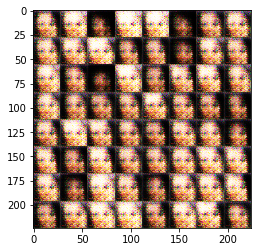

Epoch 1/1... Discriminator Loss: 0.8617... Generator Loss: 1.6584
Epoch 1/1... Discriminator Loss: 0.7036... Generator Loss: 1.9715
Epoch 1/1... Discriminator Loss: 1.0040... Generator Loss: 0.8617
Epoch 1/1... Discriminator Loss: 1.0617... Generator Loss: 0.8479
Epoch 1/1... Discriminator Loss: 0.7158... Generator Loss: 1.8452
Epoch 1/1... Discriminator Loss: 0.8441... Generator Loss: 1.4466
Epoch 1/1... Discriminator Loss: 0.7659... Generator Loss: 1.4737
Epoch 1/1... Discriminator Loss: 0.8461... Generator Loss: 2.1025
Epoch 1/1... Discriminator Loss: 1.1819... Generator Loss: 0.8957
Epoch 1/1... Discriminator Loss: 1.6728... Generator Loss: 0.4139


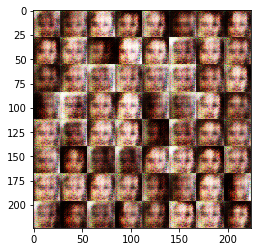

Epoch 1/1... Discriminator Loss: 1.0140... Generator Loss: 1.8790
Epoch 1/1... Discriminator Loss: 0.5975... Generator Loss: 2.5156
Epoch 1/1... Discriminator Loss: 0.8523... Generator Loss: 1.6377
Epoch 1/1... Discriminator Loss: 0.7371... Generator Loss: 2.3451
Epoch 1/1... Discriminator Loss: 0.8008... Generator Loss: 1.4156
Epoch 1/1... Discriminator Loss: 1.2482... Generator Loss: 0.8250
Epoch 1/1... Discriminator Loss: 1.2261... Generator Loss: 0.7686
Epoch 1/1... Discriminator Loss: 0.8072... Generator Loss: 1.2089
Epoch 1/1... Discriminator Loss: 1.2579... Generator Loss: 0.6941
Epoch 1/1... Discriminator Loss: 1.2215... Generator Loss: 0.9454


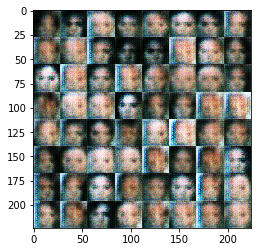

Epoch 1/1... Discriminator Loss: 0.9848... Generator Loss: 1.3118
Epoch 1/1... Discriminator Loss: 0.8937... Generator Loss: 1.4744
Epoch 1/1... Discriminator Loss: 1.2607... Generator Loss: 0.8922
Epoch 1/1... Discriminator Loss: 1.3591... Generator Loss: 0.6717
Epoch 1/1... Discriminator Loss: 1.3590... Generator Loss: 0.8192
Epoch 1/1... Discriminator Loss: 1.3334... Generator Loss: 0.8493
Epoch 1/1... Discriminator Loss: 1.2493... Generator Loss: 2.0210
Epoch 1/1... Discriminator Loss: 1.0585... Generator Loss: 1.0780
Epoch 1/1... Discriminator Loss: 1.0043... Generator Loss: 1.1826
Epoch 1/1... Discriminator Loss: 0.8997... Generator Loss: 1.1706


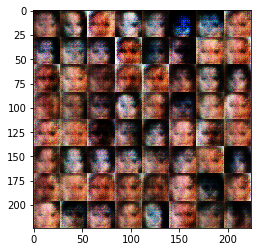

Epoch 1/1... Discriminator Loss: 1.4523... Generator Loss: 0.5855
Epoch 1/1... Discriminator Loss: 1.3655... Generator Loss: 0.6561
Epoch 1/1... Discriminator Loss: 1.1891... Generator Loss: 0.9623
Epoch 1/1... Discriminator Loss: 1.0679... Generator Loss: 1.2434
Epoch 1/1... Discriminator Loss: 1.4534... Generator Loss: 1.0119
Epoch 1/1... Discriminator Loss: 1.0949... Generator Loss: 1.2452
Epoch 1/1... Discriminator Loss: 1.5026... Generator Loss: 0.6468
Epoch 1/1... Discriminator Loss: 1.2379... Generator Loss: 0.9172
Epoch 1/1... Discriminator Loss: 1.0474... Generator Loss: 1.9974
Epoch 1/1... Discriminator Loss: 1.2876... Generator Loss: 0.6511


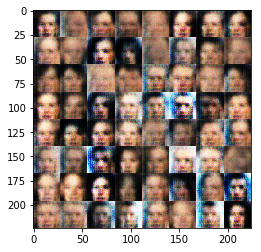

Epoch 1/1... Discriminator Loss: 1.0111... Generator Loss: 1.6370
Epoch 1/1... Discriminator Loss: 1.1414... Generator Loss: 0.8782
Epoch 1/1... Discriminator Loss: 0.8247... Generator Loss: 1.3073
Epoch 1/1... Discriminator Loss: 1.0502... Generator Loss: 1.1432
Epoch 1/1... Discriminator Loss: 0.9765... Generator Loss: 1.0493
Epoch 1/1... Discriminator Loss: 1.0760... Generator Loss: 0.9889
Epoch 1/1... Discriminator Loss: 0.8758... Generator Loss: 1.5992
Epoch 1/1... Discriminator Loss: 1.0513... Generator Loss: 0.8886
Epoch 1/1... Discriminator Loss: 1.1369... Generator Loss: 0.7001
Epoch 1/1... Discriminator Loss: 0.9724... Generator Loss: 1.4274


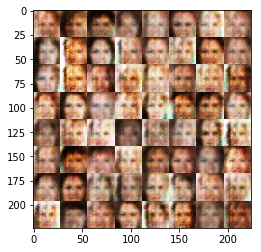

Epoch 1/1... Discriminator Loss: 1.0760... Generator Loss: 1.1309
Epoch 1/1... Discriminator Loss: 0.7790... Generator Loss: 1.4778
Epoch 1/1... Discriminator Loss: 1.1169... Generator Loss: 0.8661
Epoch 1/1... Discriminator Loss: 1.2203... Generator Loss: 1.1791
Epoch 1/1... Discriminator Loss: 1.0896... Generator Loss: 0.9825
Epoch 1/1... Discriminator Loss: 1.1945... Generator Loss: 1.2062
Epoch 1/1... Discriminator Loss: 1.1776... Generator Loss: 1.7341
Epoch 1/1... Discriminator Loss: 1.4106... Generator Loss: 0.6326
Epoch 1/1... Discriminator Loss: 1.2185... Generator Loss: 0.8393
Epoch 1/1... Discriminator Loss: 0.9427... Generator Loss: 1.4529


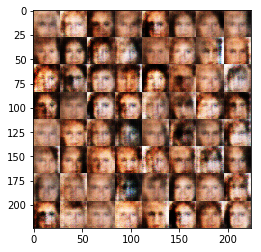

Epoch 1/1... Discriminator Loss: 1.1009... Generator Loss: 0.8109
Epoch 1/1... Discriminator Loss: 1.1365... Generator Loss: 0.9138
Epoch 1/1... Discriminator Loss: 1.0273... Generator Loss: 1.5984
Epoch 1/1... Discriminator Loss: 1.0743... Generator Loss: 1.0321
Epoch 1/1... Discriminator Loss: 1.1589... Generator Loss: 1.2914
Epoch 1/1... Discriminator Loss: 1.0947... Generator Loss: 1.4131
Epoch 1/1... Discriminator Loss: 1.0378... Generator Loss: 1.2461
Epoch 1/1... Discriminator Loss: 0.9997... Generator Loss: 1.2859
Epoch 1/1... Discriminator Loss: 1.0552... Generator Loss: 1.1753
Epoch 1/1... Discriminator Loss: 1.0489... Generator Loss: 1.1591


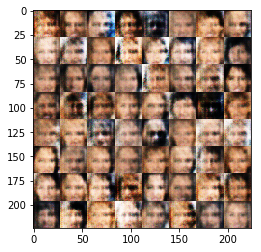

Epoch 1/1... Discriminator Loss: 1.0183... Generator Loss: 1.2061
Epoch 1/1... Discriminator Loss: 1.4454... Generator Loss: 0.6034
Epoch 1/1... Discriminator Loss: 1.2793... Generator Loss: 0.6674
Epoch 1/1... Discriminator Loss: 1.0399... Generator Loss: 1.3129
Epoch 1/1... Discriminator Loss: 1.1051... Generator Loss: 0.9894
Epoch 1/1... Discriminator Loss: 1.2347... Generator Loss: 0.7358
Epoch 1/1... Discriminator Loss: 1.2428... Generator Loss: 0.8403
Epoch 1/1... Discriminator Loss: 1.2125... Generator Loss: 1.2441
Epoch 1/1... Discriminator Loss: 1.1404... Generator Loss: 1.4536
Epoch 1/1... Discriminator Loss: 1.3060... Generator Loss: 0.6142


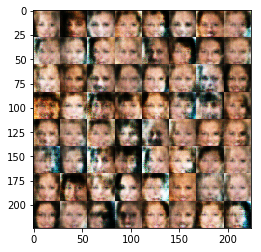

Epoch 1/1... Discriminator Loss: 1.0854... Generator Loss: 1.3616
Epoch 1/1... Discriminator Loss: 1.1916... Generator Loss: 0.8224
Epoch 1/1... Discriminator Loss: 1.2113... Generator Loss: 0.6887
Epoch 1/1... Discriminator Loss: 1.1544... Generator Loss: 1.4029
Epoch 1/1... Discriminator Loss: 1.1773... Generator Loss: 1.1957
Epoch 1/1... Discriminator Loss: 1.0570... Generator Loss: 1.6322
Epoch 1/1... Discriminator Loss: 1.2405... Generator Loss: 0.8825
Epoch 1/1... Discriminator Loss: 1.1759... Generator Loss: 0.8113
Epoch 1/1... Discriminator Loss: 1.1450... Generator Loss: 1.9045
Epoch 1/1... Discriminator Loss: 1.2898... Generator Loss: 1.2868


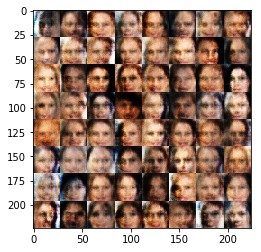

Epoch 1/1... Discriminator Loss: 1.1177... Generator Loss: 0.9125
Epoch 1/1... Discriminator Loss: 1.2442... Generator Loss: 0.6574
Epoch 1/1... Discriminator Loss: 1.0940... Generator Loss: 0.9589
Epoch 1/1... Discriminator Loss: 0.9802... Generator Loss: 1.9666
Epoch 1/1... Discriminator Loss: 0.9276... Generator Loss: 1.2925
Epoch 1/1... Discriminator Loss: 1.3752... Generator Loss: 0.7910
Epoch 1/1... Discriminator Loss: 1.0964... Generator Loss: 0.9143
Epoch 1/1... Discriminator Loss: 1.1900... Generator Loss: 1.4629
Epoch 1/1... Discriminator Loss: 1.2146... Generator Loss: 0.7868
Epoch 1/1... Discriminator Loss: 1.2629... Generator Loss: 0.8298


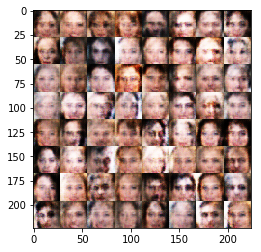

Epoch 1/1... Discriminator Loss: 1.1437... Generator Loss: 1.0915
Epoch 1/1... Discriminator Loss: 1.1476... Generator Loss: 1.0595
Epoch 1/1... Discriminator Loss: 1.0040... Generator Loss: 1.3615
Epoch 1/1... Discriminator Loss: 1.2861... Generator Loss: 0.7857
Epoch 1/1... Discriminator Loss: 1.0393... Generator Loss: 1.2638
Epoch 1/1... Discriminator Loss: 1.2355... Generator Loss: 1.4638
Epoch 1/1... Discriminator Loss: 1.0803... Generator Loss: 0.9764
Epoch 1/1... Discriminator Loss: 1.0987... Generator Loss: 0.9661
Epoch 1/1... Discriminator Loss: 1.1551... Generator Loss: 0.9069
Epoch 1/1... Discriminator Loss: 1.1649... Generator Loss: 1.5346


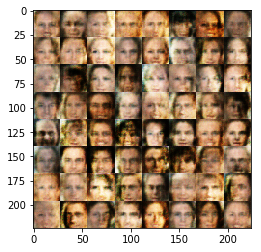

Epoch 1/1... Discriminator Loss: 0.9365... Generator Loss: 1.7819
Epoch 1/1... Discriminator Loss: 1.1263... Generator Loss: 1.4199
Epoch 1/1... Discriminator Loss: 1.2090... Generator Loss: 0.7448
Epoch 1/1... Discriminator Loss: 1.0364... Generator Loss: 1.3033
Epoch 1/1... Discriminator Loss: 1.0077... Generator Loss: 1.3728
Epoch 1/1... Discriminator Loss: 0.9832... Generator Loss: 1.4195
Epoch 1/1... Discriminator Loss: 1.0060... Generator Loss: 1.1528
Epoch 1/1... Discriminator Loss: 1.0258... Generator Loss: 1.7661
Epoch 1/1... Discriminator Loss: 1.1788... Generator Loss: 0.7724
Epoch 1/1... Discriminator Loss: 1.0780... Generator Loss: 1.0384


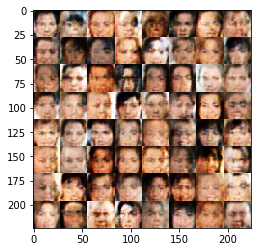

Epoch 1/1... Discriminator Loss: 1.1440... Generator Loss: 1.4984
Epoch 1/1... Discriminator Loss: 1.1486... Generator Loss: 0.9283
Epoch 1/1... Discriminator Loss: 1.1422... Generator Loss: 1.8195
Epoch 1/1... Discriminator Loss: 1.1428... Generator Loss: 0.7500
Epoch 1/1... Discriminator Loss: 1.1728... Generator Loss: 0.7587
Epoch 1/1... Discriminator Loss: 1.2051... Generator Loss: 1.4465
Epoch 1/1... Discriminator Loss: 1.2152... Generator Loss: 0.8106
Epoch 1/1... Discriminator Loss: 1.1569... Generator Loss: 0.7520
Epoch 1/1... Discriminator Loss: 1.1087... Generator Loss: 0.8737
Epoch 1/1... Discriminator Loss: 1.1038... Generator Loss: 0.9236


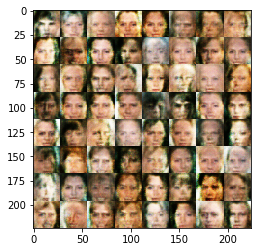

Epoch 1/1... Discriminator Loss: 1.1942... Generator Loss: 0.9854
Epoch 1/1... Discriminator Loss: 1.0339... Generator Loss: 0.8281
Epoch 1/1... Discriminator Loss: 1.0744... Generator Loss: 1.6184
Epoch 1/1... Discriminator Loss: 1.4153... Generator Loss: 0.5507
Epoch 1/1... Discriminator Loss: 1.2179... Generator Loss: 0.8387
Epoch 1/1... Discriminator Loss: 1.1119... Generator Loss: 0.9173
Epoch 1/1... Discriminator Loss: 1.1294... Generator Loss: 0.9538
Epoch 1/1... Discriminator Loss: 1.4420... Generator Loss: 0.5571
Epoch 1/1... Discriminator Loss: 1.1366... Generator Loss: 1.1051
Epoch 1/1... Discriminator Loss: 1.2286... Generator Loss: 0.6149


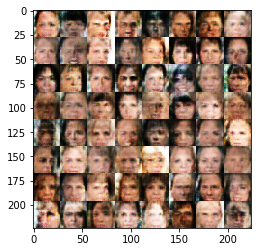

Epoch 1/1... Discriminator Loss: 0.9551... Generator Loss: 1.1712
Epoch 1/1... Discriminator Loss: 1.2502... Generator Loss: 0.8661
Epoch 1/1... Discriminator Loss: 1.2082... Generator Loss: 0.6888
Epoch 1/1... Discriminator Loss: 1.0876... Generator Loss: 1.1383
Epoch 1/1... Discriminator Loss: 0.9784... Generator Loss: 0.9318
Epoch 1/1... Discriminator Loss: 0.9619... Generator Loss: 2.0401
Epoch 1/1... Discriminator Loss: 1.3098... Generator Loss: 0.6037
Epoch 1/1... Discriminator Loss: 1.1561... Generator Loss: 0.8264
Epoch 1/1... Discriminator Loss: 0.8976... Generator Loss: 1.0695
Epoch 1/1... Discriminator Loss: 1.4680... Generator Loss: 0.5070


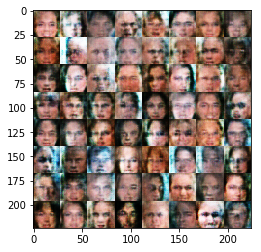

Epoch 1/1... Discriminator Loss: 1.0477... Generator Loss: 0.9987
Epoch 1/1... Discriminator Loss: 1.1439... Generator Loss: 0.7157
Epoch 1/1... Discriminator Loss: 1.0801... Generator Loss: 1.0488
Epoch 1/1... Discriminator Loss: 1.3091... Generator Loss: 0.5951
Epoch 1/1... Discriminator Loss: 1.4180... Generator Loss: 0.5070
Epoch 1/1... Discriminator Loss: 1.0513... Generator Loss: 1.0843
Epoch 1/1... Discriminator Loss: 1.4222... Generator Loss: 0.5285
Epoch 1/1... Discriminator Loss: 1.4602... Generator Loss: 0.5130
Epoch 1/1... Discriminator Loss: 1.1278... Generator Loss: 0.9412
Epoch 1/1... Discriminator Loss: 1.2175... Generator Loss: 0.6615


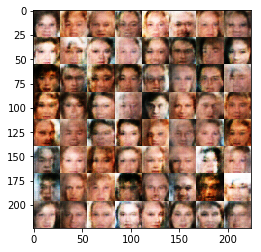

Epoch 1/1... Discriminator Loss: 1.0719... Generator Loss: 1.0051
Epoch 1/1... Discriminator Loss: 1.0879... Generator Loss: 0.8081
Epoch 1/1... Discriminator Loss: 1.1146... Generator Loss: 0.8575
Epoch 1/1... Discriminator Loss: 1.1388... Generator Loss: 0.7918
Epoch 1/1... Discriminator Loss: 1.1817... Generator Loss: 1.0265
Epoch 1/1... Discriminator Loss: 1.0215... Generator Loss: 1.1340
Epoch 1/1... Discriminator Loss: 1.1073... Generator Loss: 0.9949
Epoch 1/1... Discriminator Loss: 1.1454... Generator Loss: 0.7342
Epoch 1/1... Discriminator Loss: 1.1754... Generator Loss: 0.7093
Epoch 1/1... Discriminator Loss: 1.2140... Generator Loss: 1.0956


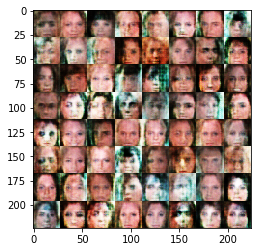

Epoch 1/1... Discriminator Loss: 1.2902... Generator Loss: 1.4569
Epoch 1/1... Discriminator Loss: 1.0187... Generator Loss: 1.7039
Epoch 1/1... Discriminator Loss: 1.2049... Generator Loss: 0.7863
Epoch 1/1... Discriminator Loss: 1.1916... Generator Loss: 0.7617
Epoch 1/1... Discriminator Loss: 1.1108... Generator Loss: 1.0244
Epoch 1/1... Discriminator Loss: 1.1444... Generator Loss: 0.8212
Epoch 1/1... Discriminator Loss: 0.9535... Generator Loss: 1.0846
Epoch 1/1... Discriminator Loss: 1.1459... Generator Loss: 0.8066
Epoch 1/1... Discriminator Loss: 1.1749... Generator Loss: 0.8832
Epoch 1/1... Discriminator Loss: 1.1843... Generator Loss: 0.9738


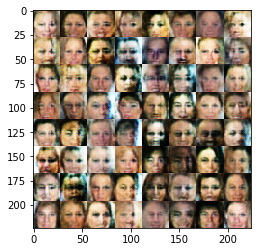

Epoch 1/1... Discriminator Loss: 1.1221... Generator Loss: 1.4183
Epoch 1/1... Discriminator Loss: 1.1437... Generator Loss: 1.2482
Epoch 1/1... Discriminator Loss: 1.2189... Generator Loss: 1.1777
Epoch 1/1... Discriminator Loss: 1.0977... Generator Loss: 0.9258
Epoch 1/1... Discriminator Loss: 1.2853... Generator Loss: 0.7724
Epoch 1/1... Discriminator Loss: 1.2035... Generator Loss: 0.8801
Epoch 1/1... Discriminator Loss: 1.1486... Generator Loss: 1.1781
Epoch 1/1... Discriminator Loss: 1.1537... Generator Loss: 1.0488
Epoch 1/1... Discriminator Loss: 1.1813... Generator Loss: 0.6890
Epoch 1/1... Discriminator Loss: 1.2729... Generator Loss: 1.2064


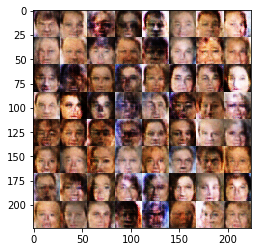

Epoch 1/1... Discriminator Loss: 1.0641... Generator Loss: 0.8456
Epoch 1/1... Discriminator Loss: 1.2266... Generator Loss: 0.8813
Epoch 1/1... Discriminator Loss: 1.3755... Generator Loss: 0.7829
Epoch 1/1... Discriminator Loss: 1.0880... Generator Loss: 0.8785
Epoch 1/1... Discriminator Loss: 1.0212... Generator Loss: 1.2073
Epoch 1/1... Discriminator Loss: 1.1724... Generator Loss: 0.9721
Epoch 1/1... Discriminator Loss: 1.3542... Generator Loss: 0.5579
Epoch 1/1... Discriminator Loss: 1.1174... Generator Loss: 0.9926
Epoch 1/1... Discriminator Loss: 1.1850... Generator Loss: 0.9816
Epoch 1/1... Discriminator Loss: 1.1930... Generator Loss: 0.9767


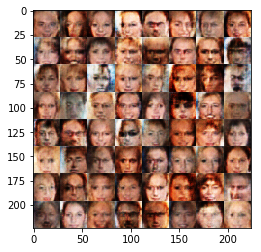

Epoch 1/1... Discriminator Loss: 1.1308... Generator Loss: 0.8606
Epoch 1/1... Discriminator Loss: 1.1536... Generator Loss: 1.4648
Epoch 1/1... Discriminator Loss: 0.9077... Generator Loss: 1.6013
Epoch 1/1... Discriminator Loss: 0.9299... Generator Loss: 1.1276
Epoch 1/1... Discriminator Loss: 1.1832... Generator Loss: 0.9420
Epoch 1/1... Discriminator Loss: 1.2125... Generator Loss: 0.7011
Epoch 1/1... Discriminator Loss: 1.0238... Generator Loss: 1.2670
Epoch 1/1... Discriminator Loss: 1.3530... Generator Loss: 0.5120
Epoch 1/1... Discriminator Loss: 1.0993... Generator Loss: 1.6753
Epoch 1/1... Discriminator Loss: 1.0794... Generator Loss: 0.8332


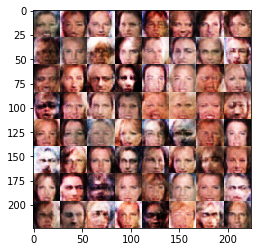

Epoch 1/1... Discriminator Loss: 1.0652... Generator Loss: 0.9654
Epoch 1/1... Discriminator Loss: 1.0014... Generator Loss: 1.0208
Epoch 1/1... Discriminator Loss: 1.2281... Generator Loss: 0.7110
Epoch 1/1... Discriminator Loss: 1.2121... Generator Loss: 0.9049
Epoch 1/1... Discriminator Loss: 1.1726... Generator Loss: 1.0073
Epoch 1/1... Discriminator Loss: 1.2243... Generator Loss: 1.2078
Epoch 1/1... Discriminator Loss: 1.1427... Generator Loss: 1.8046
Epoch 1/1... Discriminator Loss: 1.0822... Generator Loss: 0.9013
Epoch 1/1... Discriminator Loss: 0.8751... Generator Loss: 1.2733
Epoch 1/1... Discriminator Loss: 1.2353... Generator Loss: 1.1194


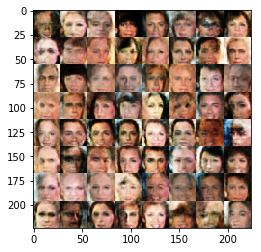

Epoch 1/1... Discriminator Loss: 1.1086... Generator Loss: 0.8372
Epoch 1/1... Discriminator Loss: 1.1813... Generator Loss: 1.3936
Epoch 1/1... Discriminator Loss: 1.1944... Generator Loss: 0.8412
Epoch 1/1... Discriminator Loss: 1.2799... Generator Loss: 0.6460
Epoch 1/1... Discriminator Loss: 1.2459... Generator Loss: 0.8076
Epoch 1/1... Discriminator Loss: 1.0873... Generator Loss: 0.9939
Epoch 1/1... Discriminator Loss: 1.1957... Generator Loss: 0.7882
Epoch 1/1... Discriminator Loss: 1.1511... Generator Loss: 0.8013
Epoch 1/1... Discriminator Loss: 1.1773... Generator Loss: 0.8107
Epoch 1/1... Discriminator Loss: 0.9885... Generator Loss: 1.0770


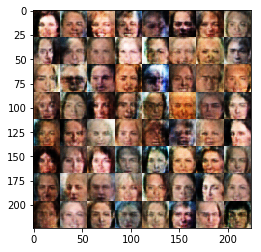

Epoch 1/1... Discriminator Loss: 1.1886... Generator Loss: 1.1082
Epoch 1/1... Discriminator Loss: 1.2627... Generator Loss: 0.7383
Epoch 1/1... Discriminator Loss: 0.9613... Generator Loss: 1.0031
Epoch 1/1... Discriminator Loss: 1.2056... Generator Loss: 0.7191
Epoch 1/1... Discriminator Loss: 1.2089... Generator Loss: 0.7371
Epoch 1/1... Discriminator Loss: 1.0112... Generator Loss: 1.1267
Epoch 1/1... Discriminator Loss: 1.1801... Generator Loss: 1.0453
Epoch 1/1... Discriminator Loss: 1.1226... Generator Loss: 1.2916
Epoch 1/1... Discriminator Loss: 1.5276... Generator Loss: 0.4305
Epoch 1/1... Discriminator Loss: 1.3395... Generator Loss: 0.5918


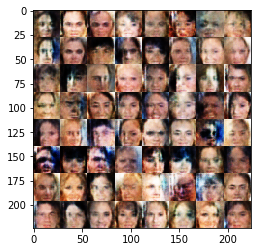

Epoch 1/1... Discriminator Loss: 1.0148... Generator Loss: 1.0784
Epoch 1/1... Discriminator Loss: 1.0777... Generator Loss: 1.1638
Epoch 1/1... Discriminator Loss: 0.9375... Generator Loss: 1.0881
Epoch 1/1... Discriminator Loss: 1.4024... Generator Loss: 0.5162
Epoch 1/1... Discriminator Loss: 1.2795... Generator Loss: 0.6605
Epoch 1/1... Discriminator Loss: 0.9781... Generator Loss: 1.0879
Epoch 1/1... Discriminator Loss: 1.1886... Generator Loss: 1.1974
Epoch 1/1... Discriminator Loss: 1.3263... Generator Loss: 0.5361
Epoch 1/1... Discriminator Loss: 1.1323... Generator Loss: 1.4904
Epoch 1/1... Discriminator Loss: 1.1535... Generator Loss: 1.2805


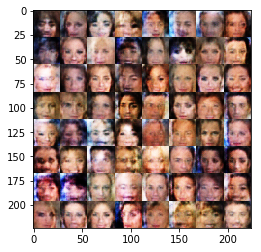

Epoch 1/1... Discriminator Loss: 1.1884... Generator Loss: 0.7845
Epoch 1/1... Discriminator Loss: 0.9639... Generator Loss: 1.0718
Epoch 1/1... Discriminator Loss: 0.7878... Generator Loss: 1.6812
Epoch 1/1... Discriminator Loss: 0.9254... Generator Loss: 1.4078
Epoch 1/1... Discriminator Loss: 1.1105... Generator Loss: 1.5602
Epoch 1/1... Discriminator Loss: 0.9957... Generator Loss: 1.1825
Epoch 1/1... Discriminator Loss: 1.0210... Generator Loss: 1.0108
Epoch 1/1... Discriminator Loss: 1.0474... Generator Loss: 0.9586
Epoch 1/1... Discriminator Loss: 1.0641... Generator Loss: 0.8693
Epoch 1/1... Discriminator Loss: 1.0368... Generator Loss: 1.0969


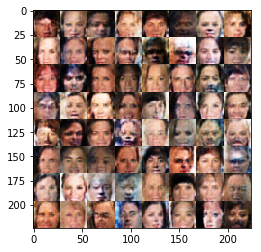

Epoch 1/1... Discriminator Loss: 1.0535... Generator Loss: 1.1645
Epoch 1/1... Discriminator Loss: 1.0593... Generator Loss: 1.6611
Epoch 1/1... Discriminator Loss: 1.0977... Generator Loss: 0.9740
Epoch 1/1... Discriminator Loss: 1.0624... Generator Loss: 0.9381
Epoch 1/1... Discriminator Loss: 1.0960... Generator Loss: 1.0876
Epoch 1/1... Discriminator Loss: 1.2203... Generator Loss: 0.7200
Epoch 1/1... Discriminator Loss: 0.8566... Generator Loss: 1.2006
Epoch 1/1... Discriminator Loss: 1.2591... Generator Loss: 0.5691
Epoch 1/1... Discriminator Loss: 1.0985... Generator Loss: 1.0154
Epoch 1/1... Discriminator Loss: 1.2838... Generator Loss: 0.9925


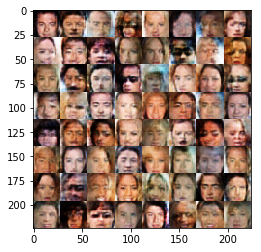

Epoch 1/1... Discriminator Loss: 0.9340... Generator Loss: 1.4449
Epoch 1/1... Discriminator Loss: 1.1538... Generator Loss: 0.7473
Epoch 1/1... Discriminator Loss: 1.0424... Generator Loss: 0.9380
Epoch 1/1... Discriminator Loss: 1.0383... Generator Loss: 1.5792
Epoch 1/1... Discriminator Loss: 1.0727... Generator Loss: 1.2507
Epoch 1/1... Discriminator Loss: 1.1875... Generator Loss: 0.7001
Epoch 1/1... Discriminator Loss: 1.1434... Generator Loss: 0.8346
Epoch 1/1... Discriminator Loss: 1.1960... Generator Loss: 0.6331
Epoch 1/1... Discriminator Loss: 1.2752... Generator Loss: 0.6274
Epoch 1/1... Discriminator Loss: 1.4590... Generator Loss: 0.4734


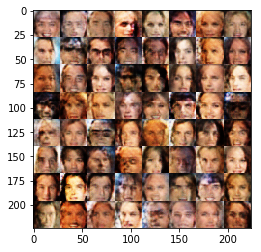

Epoch 1/1... Discriminator Loss: 1.1824... Generator Loss: 0.7908
Epoch 1/1... Discriminator Loss: 1.2078... Generator Loss: 0.7682
Epoch 1/1... Discriminator Loss: 1.2474... Generator Loss: 0.7569
Epoch 1/1... Discriminator Loss: 1.2251... Generator Loss: 1.0945
Epoch 1/1... Discriminator Loss: 1.0968... Generator Loss: 0.9839
Epoch 1/1... Discriminator Loss: 1.0545... Generator Loss: 1.0310
Epoch 1/1... Discriminator Loss: 1.5246... Generator Loss: 0.4306
Epoch 1/1... Discriminator Loss: 1.0032... Generator Loss: 0.8471
Epoch 1/1... Discriminator Loss: 1.1271... Generator Loss: 0.7863
Epoch 1/1... Discriminator Loss: 1.0961... Generator Loss: 0.8382


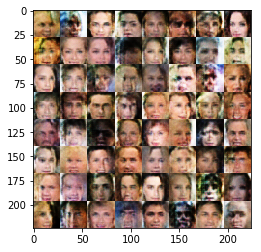

Epoch 1/1... Discriminator Loss: 1.3444... Generator Loss: 0.6213
Epoch 1/1... Discriminator Loss: 1.3805... Generator Loss: 0.5940
Epoch 1/1... Discriminator Loss: 1.2040... Generator Loss: 0.8389
Epoch 1/1... Discriminator Loss: 1.3548... Generator Loss: 0.5674
Epoch 1/1... Discriminator Loss: 1.1121... Generator Loss: 0.9927
Epoch 1/1... Discriminator Loss: 0.9808... Generator Loss: 0.9843
Epoch 1/1... Discriminator Loss: 1.2527... Generator Loss: 0.7450
Epoch 1/1... Discriminator Loss: 0.9669... Generator Loss: 1.1076
Epoch 1/1... Discriminator Loss: 1.2297... Generator Loss: 0.7486
Epoch 1/1... Discriminator Loss: 1.0117... Generator Loss: 1.2537


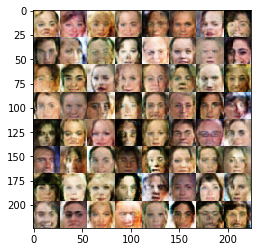

Epoch 1/1... Discriminator Loss: 1.1581... Generator Loss: 0.8856
Epoch 1/1... Discriminator Loss: 1.0055... Generator Loss: 0.9958
Epoch 1/1... Discriminator Loss: 1.2966... Generator Loss: 0.6114
Epoch 1/1... Discriminator Loss: 1.0616... Generator Loss: 1.5276
Epoch 1/1... Discriminator Loss: 1.2045... Generator Loss: 0.8016
Epoch 1/1... Discriminator Loss: 1.1571... Generator Loss: 1.1743
Epoch 1/1... Discriminator Loss: 1.3014... Generator Loss: 0.5879
Epoch 1/1... Discriminator Loss: 1.0132... Generator Loss: 0.9304
Epoch 1/1... Discriminator Loss: 1.0530... Generator Loss: 0.8698
Epoch 1/1... Discriminator Loss: 1.3927... Generator Loss: 0.5062


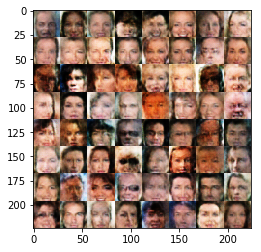

Epoch 1/1... Discriminator Loss: 1.0347... Generator Loss: 1.7090
Epoch 1/1... Discriminator Loss: 1.0679... Generator Loss: 0.9034
Epoch 1/1... Discriminator Loss: 0.9100... Generator Loss: 1.1663
Epoch 1/1... Discriminator Loss: 1.0496... Generator Loss: 0.8197
Epoch 1/1... Discriminator Loss: 1.2990... Generator Loss: 0.6125
Epoch 1/1... Discriminator Loss: 0.8898... Generator Loss: 1.4927
Epoch 1/1... Discriminator Loss: 1.2320... Generator Loss: 0.7480
Epoch 1/1... Discriminator Loss: 1.1780... Generator Loss: 0.8017
Epoch 1/1... Discriminator Loss: 1.0787... Generator Loss: 0.7994
Epoch 1/1... Discriminator Loss: 1.2599... Generator Loss: 0.7091


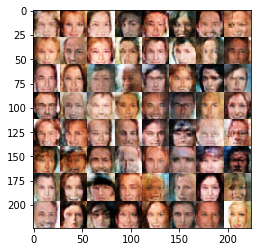

Epoch 1/1... Discriminator Loss: 1.1694... Generator Loss: 0.9601
Epoch 1/1... Discriminator Loss: 1.1377... Generator Loss: 1.3229
Epoch 1/1... Discriminator Loss: 1.2532... Generator Loss: 0.6310
Epoch 1/1... Discriminator Loss: 0.8263... Generator Loss: 1.2278
Epoch 1/1... Discriminator Loss: 1.0826... Generator Loss: 0.8062
Epoch 1/1... Discriminator Loss: 1.3239... Generator Loss: 0.5717
Epoch 1/1... Discriminator Loss: 1.0235... Generator Loss: 1.3759
Epoch 1/1... Discriminator Loss: 1.0210... Generator Loss: 1.1280
Epoch 1/1... Discriminator Loss: 1.0146... Generator Loss: 1.2975
Epoch 1/1... Discriminator Loss: 0.9799... Generator Loss: 0.9775


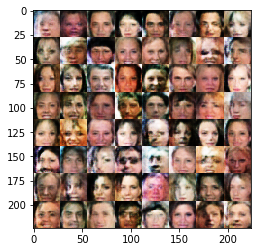

Epoch 1/1... Discriminator Loss: 1.3172... Generator Loss: 0.5673
Epoch 1/1... Discriminator Loss: 1.5286... Generator Loss: 0.4410
Epoch 1/1... Discriminator Loss: 0.9857... Generator Loss: 1.0315
Epoch 1/1... Discriminator Loss: 1.2213... Generator Loss: 0.6196
Epoch 1/1... Discriminator Loss: 1.3565... Generator Loss: 0.5439
Epoch 1/1... Discriminator Loss: 1.0019... Generator Loss: 1.6534
Epoch 1/1... Discriminator Loss: 1.2946... Generator Loss: 0.6280
Epoch 1/1... Discriminator Loss: 1.1273... Generator Loss: 0.8264
Epoch 1/1... Discriminator Loss: 1.3241... Generator Loss: 0.6112
Epoch 1/1... Discriminator Loss: 1.0010... Generator Loss: 0.8904


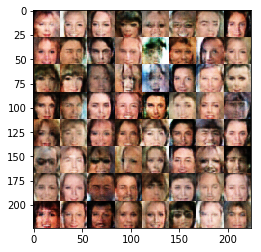

Epoch 1/1... Discriminator Loss: 1.3079... Generator Loss: 0.6082
Epoch 1/1... Discriminator Loss: 1.0040... Generator Loss: 1.4551
Epoch 1/1... Discriminator Loss: 1.6298... Generator Loss: 0.3908
Epoch 1/1... Discriminator Loss: 0.9725... Generator Loss: 1.0347
Epoch 1/1... Discriminator Loss: 1.2961... Generator Loss: 1.4443
Epoch 1/1... Discriminator Loss: 0.9794... Generator Loss: 1.0992
Epoch 1/1... Discriminator Loss: 1.0604... Generator Loss: 0.9965
Epoch 1/1... Discriminator Loss: 0.6783... Generator Loss: 2.1725
Epoch 1/1... Discriminator Loss: 1.1633... Generator Loss: 0.7071
Epoch 1/1... Discriminator Loss: 0.8400... Generator Loss: 1.5728


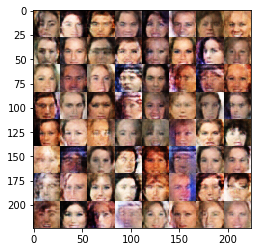

Epoch 1/1... Discriminator Loss: 1.2570... Generator Loss: 1.3831
Epoch 1/1... Discriminator Loss: 0.9608... Generator Loss: 1.5135
Epoch 1/1... Discriminator Loss: 0.9806... Generator Loss: 1.1820
Epoch 1/1... Discriminator Loss: 1.4273... Generator Loss: 0.5891
Epoch 1/1... Discriminator Loss: 0.9952... Generator Loss: 0.9878
Epoch 1/1... Discriminator Loss: 1.1407... Generator Loss: 0.8578
Epoch 1/1... Discriminator Loss: 0.9161... Generator Loss: 1.1908
Epoch 1/1... Discriminator Loss: 1.4428... Generator Loss: 0.4630
Epoch 1/1... Discriminator Loss: 1.0189... Generator Loss: 1.2298
Epoch 1/1... Discriminator Loss: 1.0294... Generator Loss: 1.1341


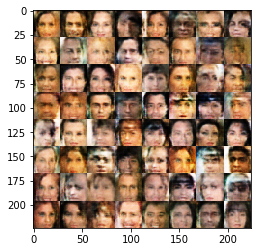

Epoch 1/1... Discriminator Loss: 1.1163... Generator Loss: 0.7618
Epoch 1/1... Discriminator Loss: 1.2642... Generator Loss: 0.6580
Epoch 1/1... Discriminator Loss: 1.2226... Generator Loss: 1.3422
Epoch 1/1... Discriminator Loss: 1.2620... Generator Loss: 1.0461
Epoch 1/1... Discriminator Loss: 0.9823... Generator Loss: 0.9216
Epoch 1/1... Discriminator Loss: 0.9977... Generator Loss: 1.3983
Epoch 1/1... Discriminator Loss: 1.0007... Generator Loss: 1.0799
Epoch 1/1... Discriminator Loss: 1.6260... Generator Loss: 0.3960
Epoch 1/1... Discriminator Loss: 0.8959... Generator Loss: 1.4386
Epoch 1/1... Discriminator Loss: 1.5437... Generator Loss: 0.4311


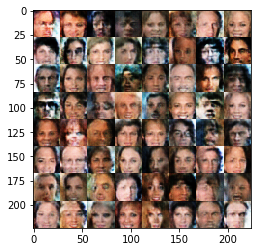

Epoch 1/1... Discriminator Loss: 1.0101... Generator Loss: 1.0556
Epoch 1/1... Discriminator Loss: 1.2621... Generator Loss: 0.6640
Epoch 1/1... Discriminator Loss: 1.1198... Generator Loss: 0.8000
Epoch 1/1... Discriminator Loss: 1.2918... Generator Loss: 1.0060
Epoch 1/1... Discriminator Loss: 1.2777... Generator Loss: 0.7819
Epoch 1/1... Discriminator Loss: 1.1308... Generator Loss: 0.7909
Epoch 1/1... Discriminator Loss: 1.0103... Generator Loss: 1.0819
Epoch 1/1... Discriminator Loss: 1.2313... Generator Loss: 0.6460
Epoch 1/1... Discriminator Loss: 0.9450... Generator Loss: 1.4199
Epoch 1/1... Discriminator Loss: 1.0655... Generator Loss: 1.1709


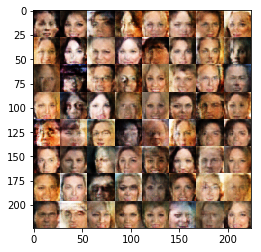

Epoch 1/1... Discriminator Loss: 1.0107... Generator Loss: 0.8888
Epoch 1/1... Discriminator Loss: 1.0379... Generator Loss: 0.9032
Epoch 1/1... Discriminator Loss: 1.1832... Generator Loss: 0.6520
Epoch 1/1... Discriminator Loss: 1.2574... Generator Loss: 0.7343
Epoch 1/1... Discriminator Loss: 0.9969... Generator Loss: 1.2929
Epoch 1/1... Discriminator Loss: 0.8650... Generator Loss: 1.2486
Epoch 1/1... Discriminator Loss: 1.3376... Generator Loss: 0.5599
Epoch 1/1... Discriminator Loss: 0.9307... Generator Loss: 1.1679
Epoch 1/1... Discriminator Loss: 1.1044... Generator Loss: 0.9980
Epoch 1/1... Discriminator Loss: 1.3482... Generator Loss: 0.7004


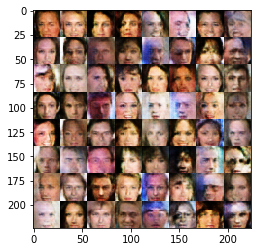

Epoch 1/1... Discriminator Loss: 1.4056... Generator Loss: 0.5276
Epoch 1/1... Discriminator Loss: 0.9598... Generator Loss: 1.0235
Epoch 1/1... Discriminator Loss: 1.0900... Generator Loss: 0.8109
Epoch 1/1... Discriminator Loss: 1.1433... Generator Loss: 0.8764
Epoch 1/1... Discriminator Loss: 1.1554... Generator Loss: 0.7984
Epoch 1/1... Discriminator Loss: 1.0531... Generator Loss: 1.3161
Epoch 1/1... Discriminator Loss: 1.2467... Generator Loss: 0.6333
Epoch 1/1... Discriminator Loss: 1.0848... Generator Loss: 0.9620
Epoch 1/1... Discriminator Loss: 1.0980... Generator Loss: 0.9693
Epoch 1/1... Discriminator Loss: 0.9991... Generator Loss: 1.1872


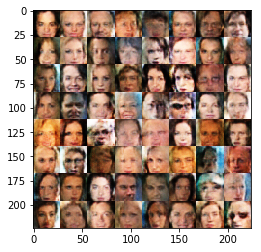

Epoch 1/1... Discriminator Loss: 1.7677... Generator Loss: 0.3666
Epoch 1/1... Discriminator Loss: 1.1878... Generator Loss: 0.7447
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.6444
Epoch 1/1... Discriminator Loss: 0.9974... Generator Loss: 0.9673
Epoch 1/1... Discriminator Loss: 1.2188... Generator Loss: 0.6461
Epoch 1/1... Discriminator Loss: 0.9071... Generator Loss: 1.1486
Epoch 1/1... Discriminator Loss: 1.0945... Generator Loss: 0.8096
Epoch 1/1... Discriminator Loss: 1.4088... Generator Loss: 0.5301
Epoch 1/1... Discriminator Loss: 1.0711... Generator Loss: 0.9130
Epoch 1/1... Discriminator Loss: 1.1370... Generator Loss: 1.0074


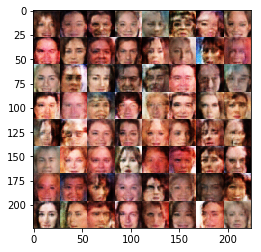

Epoch 1/1... Discriminator Loss: 1.3536... Generator Loss: 0.5526
Epoch 1/1... Discriminator Loss: 1.1017... Generator Loss: 0.9822
Epoch 1/1... Discriminator Loss: 0.9953... Generator Loss: 1.2822
Epoch 1/1... Discriminator Loss: 1.0101... Generator Loss: 0.9719
Epoch 1/1... Discriminator Loss: 1.1492... Generator Loss: 0.7189
Epoch 1/1... Discriminator Loss: 1.2675... Generator Loss: 0.6185
Epoch 1/1... Discriminator Loss: 1.1205... Generator Loss: 0.7721
Epoch 1/1... Discriminator Loss: 1.3591... Generator Loss: 0.5236
Epoch 1/1... Discriminator Loss: 1.0180... Generator Loss: 1.9319
Epoch 1/1... Discriminator Loss: 1.2369... Generator Loss: 0.7153


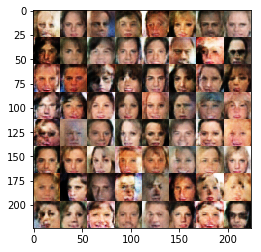

Epoch 1/1... Discriminator Loss: 1.2842... Generator Loss: 0.5578
Epoch 1/1... Discriminator Loss: 1.0303... Generator Loss: 0.9704
Epoch 1/1... Discriminator Loss: 0.9806... Generator Loss: 1.1291
Epoch 1/1... Discriminator Loss: 1.3058... Generator Loss: 0.6120
Epoch 1/1... Discriminator Loss: 1.2913... Generator Loss: 0.6042
Epoch 1/1... Discriminator Loss: 1.2332... Generator Loss: 0.6732
Epoch 1/1... Discriminator Loss: 1.0995... Generator Loss: 0.9789
Epoch 1/1... Discriminator Loss: 1.0393... Generator Loss: 0.8671
Epoch 1/1... Discriminator Loss: 1.0768... Generator Loss: 0.9556
Epoch 1/1... Discriminator Loss: 1.2422... Generator Loss: 0.6702


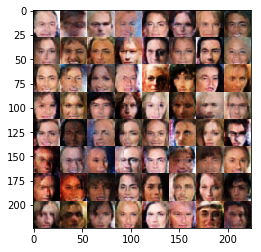

Epoch 1/1... Discriminator Loss: 1.1131... Generator Loss: 0.7709
Epoch 1/1... Discriminator Loss: 0.9553... Generator Loss: 0.9301
Epoch 1/1... Discriminator Loss: 1.1344... Generator Loss: 0.7134
Epoch 1/1... Discriminator Loss: 1.0906... Generator Loss: 0.9769
Epoch 1/1... Discriminator Loss: 1.1379... Generator Loss: 0.8516
Epoch 1/1... Discriminator Loss: 0.8904... Generator Loss: 1.3508
Epoch 1/1... Discriminator Loss: 0.8348... Generator Loss: 1.1790
Epoch 1/1... Discriminator Loss: 1.6116... Generator Loss: 0.4076
Epoch 1/1... Discriminator Loss: 1.3479... Generator Loss: 0.5518
Epoch 1/1... Discriminator Loss: 1.3338... Generator Loss: 1.7631


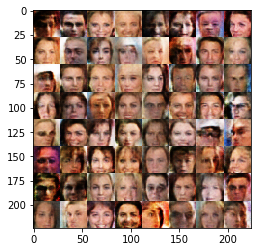

Epoch 1/1... Discriminator Loss: 0.7800... Generator Loss: 1.4572
Epoch 1/1... Discriminator Loss: 1.2695... Generator Loss: 0.6725
Epoch 1/1... Discriminator Loss: 1.3954... Generator Loss: 0.5575
Epoch 1/1... Discriminator Loss: 1.3667... Generator Loss: 0.5972
Epoch 1/1... Discriminator Loss: 1.1137... Generator Loss: 0.8090
Epoch 1/1... Discriminator Loss: 1.1308... Generator Loss: 0.7410
Epoch 1/1... Discriminator Loss: 0.9686... Generator Loss: 1.2718
Epoch 1/1... Discriminator Loss: 1.0881... Generator Loss: 0.9468
Epoch 1/1... Discriminator Loss: 1.1646... Generator Loss: 0.7786
Epoch 1/1... Discriminator Loss: 0.9905... Generator Loss: 0.8333


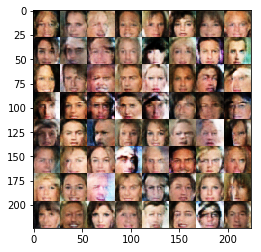

Epoch 1/1... Discriminator Loss: 1.0317... Generator Loss: 1.3727
Epoch 1/1... Discriminator Loss: 1.0962... Generator Loss: 0.9058
Epoch 1/1... Discriminator Loss: 1.0974... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.4851... Generator Loss: 0.4269
Epoch 1/1... Discriminator Loss: 1.2708... Generator Loss: 0.7791
Epoch 1/1... Discriminator Loss: 1.3244... Generator Loss: 0.5416
Epoch 1/1... Discriminator Loss: 1.2728... Generator Loss: 0.6190
Epoch 1/1... Discriminator Loss: 1.0689... Generator Loss: 1.3752
Epoch 1/1... Discriminator Loss: 1.4339... Generator Loss: 0.4855
Epoch 1/1... Discriminator Loss: 1.0260... Generator Loss: 1.2586


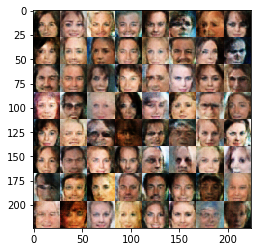

Epoch 1/1... Discriminator Loss: 1.1144... Generator Loss: 0.7594
Epoch 1/1... Discriminator Loss: 1.0746... Generator Loss: 0.9474
Epoch 1/1... Discriminator Loss: 1.1077... Generator Loss: 0.6995
Epoch 1/1... Discriminator Loss: 1.0803... Generator Loss: 1.3538
Epoch 1/1... Discriminator Loss: 1.3176... Generator Loss: 0.5706
Epoch 1/1... Discriminator Loss: 1.1246... Generator Loss: 0.7237
Epoch 1/1... Discriminator Loss: 1.2038... Generator Loss: 0.7249
Epoch 1/1... Discriminator Loss: 1.2827... Generator Loss: 0.7075
Epoch 1/1... Discriminator Loss: 1.0337... Generator Loss: 1.0627
Epoch 1/1... Discriminator Loss: 1.0690... Generator Loss: 1.1879


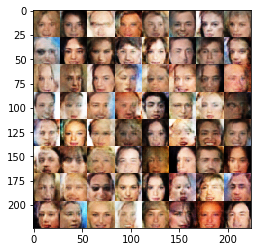

Epoch 1/1... Discriminator Loss: 1.1440... Generator Loss: 0.7282
Epoch 1/1... Discriminator Loss: 1.0013... Generator Loss: 0.8890
Epoch 1/1... Discriminator Loss: 1.1277... Generator Loss: 1.4523
Epoch 1/1... Discriminator Loss: 1.4370... Generator Loss: 0.4620
Epoch 1/1... Discriminator Loss: 1.0485... Generator Loss: 1.2088
Epoch 1/1... Discriminator Loss: 1.1926... Generator Loss: 0.9256
Epoch 1/1... Discriminator Loss: 1.1433... Generator Loss: 0.7744
Epoch 1/1... Discriminator Loss: 1.3084... Generator Loss: 1.6791
Epoch 1/1... Discriminator Loss: 1.4832... Generator Loss: 0.4919
Epoch 1/1... Discriminator Loss: 1.2595... Generator Loss: 0.6083


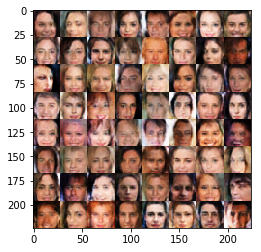

Epoch 1/1... Discriminator Loss: 1.3163... Generator Loss: 0.5827
Epoch 1/1... Discriminator Loss: 1.0565... Generator Loss: 1.1416
Epoch 1/1... Discriminator Loss: 1.2906... Generator Loss: 0.5568
Epoch 1/1... Discriminator Loss: 1.0076... Generator Loss: 0.9673
Epoch 1/1... Discriminator Loss: 1.2721... Generator Loss: 1.2010
Epoch 1/1... Discriminator Loss: 1.0371... Generator Loss: 1.2096
Epoch 1/1... Discriminator Loss: 1.2759... Generator Loss: 0.8079
Epoch 1/1... Discriminator Loss: 1.0705... Generator Loss: 1.6284
Epoch 1/1... Discriminator Loss: 1.2442... Generator Loss: 0.6191
Epoch 1/1... Discriminator Loss: 1.2026... Generator Loss: 1.2727


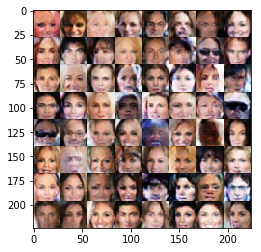

Epoch 1/1... Discriminator Loss: 0.9777... Generator Loss: 0.9658
Epoch 1/1... Discriminator Loss: 1.3060... Generator Loss: 0.6762
Epoch 1/1... Discriminator Loss: 0.9269... Generator Loss: 1.0014
Epoch 1/1... Discriminator Loss: 1.1390... Generator Loss: 0.9177
Epoch 1/1... Discriminator Loss: 1.0190... Generator Loss: 1.0061
Epoch 1/1... Discriminator Loss: 1.1953... Generator Loss: 0.7518
Epoch 1/1... Discriminator Loss: 1.0725... Generator Loss: 0.7671
Epoch 1/1... Discriminator Loss: 1.0913... Generator Loss: 1.0571
Epoch 1/1... Discriminator Loss: 0.9167... Generator Loss: 1.4204
Epoch 1/1... Discriminator Loss: 1.4101... Generator Loss: 1.1083


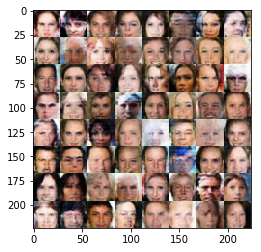

Epoch 1/1... Discriminator Loss: 1.3506... Generator Loss: 0.5485
Epoch 1/1... Discriminator Loss: 1.5136... Generator Loss: 0.4724
Epoch 1/1... Discriminator Loss: 0.9836... Generator Loss: 1.2891
Epoch 1/1... Discriminator Loss: 1.2191... Generator Loss: 0.7841
Epoch 1/1... Discriminator Loss: 1.0697... Generator Loss: 0.9241
Epoch 1/1... Discriminator Loss: 1.3931... Generator Loss: 0.6380
Epoch 1/1... Discriminator Loss: 0.9313... Generator Loss: 1.1813
Epoch 1/1... Discriminator Loss: 1.0585... Generator Loss: 1.1244
Epoch 1/1... Discriminator Loss: 1.0529... Generator Loss: 1.1757
Epoch 1/1... Discriminator Loss: 1.0643... Generator Loss: 0.8305


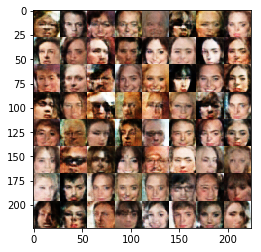

Epoch 1/1... Discriminator Loss: 1.0214... Generator Loss: 0.9467
Epoch 1/1... Discriminator Loss: 1.0448... Generator Loss: 0.8645
Epoch 1/1... Discriminator Loss: 1.0408... Generator Loss: 0.9150
Epoch 1/1... Discriminator Loss: 1.0778... Generator Loss: 0.7748
Epoch 1/1... Discriminator Loss: 1.1310... Generator Loss: 0.7319
Epoch 1/1... Discriminator Loss: 1.1123... Generator Loss: 0.7484
Epoch 1/1... Discriminator Loss: 1.5496... Generator Loss: 0.5371
Epoch 1/1... Discriminator Loss: 1.3400... Generator Loss: 0.5596
Epoch 1/1... Discriminator Loss: 1.0413... Generator Loss: 0.9218
Epoch 1/1... Discriminator Loss: 1.8125... Generator Loss: 0.3182


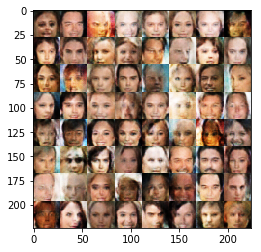

Epoch 1/1... Discriminator Loss: 0.9260... Generator Loss: 1.0934
Epoch 1/1... Discriminator Loss: 0.8759... Generator Loss: 1.3098
Epoch 1/1... Discriminator Loss: 1.0938... Generator Loss: 0.7581
Epoch 1/1... Discriminator Loss: 0.9806... Generator Loss: 1.3573
Epoch 1/1... Discriminator Loss: 1.0882... Generator Loss: 0.9322
Epoch 1/1... Discriminator Loss: 1.1728... Generator Loss: 0.6660
Epoch 1/1... Discriminator Loss: 1.0524... Generator Loss: 1.0106
Epoch 1/1... Discriminator Loss: 0.9595... Generator Loss: 1.2531
Epoch 1/1... Discriminator Loss: 1.1990... Generator Loss: 0.9529
Epoch 1/1... Discriminator Loss: 1.2581... Generator Loss: 0.6826


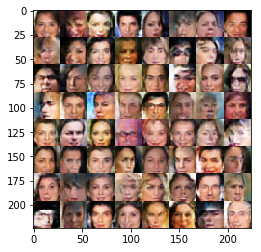

Epoch 1/1... Discriminator Loss: 1.2368... Generator Loss: 0.7946
Epoch 1/1... Discriminator Loss: 1.5580... Generator Loss: 0.4255
Epoch 1/1... Discriminator Loss: 1.4906... Generator Loss: 0.4281
Epoch 1/1... Discriminator Loss: 1.2624... Generator Loss: 0.6572
Epoch 1/1... Discriminator Loss: 1.0508... Generator Loss: 0.7896
Epoch 1/1... Discriminator Loss: 1.3427... Generator Loss: 0.8237
Epoch 1/1... Discriminator Loss: 1.1189... Generator Loss: 0.9236
Epoch 1/1... Discriminator Loss: 1.2441... Generator Loss: 0.6756
Epoch 1/1... Discriminator Loss: 1.5892... Generator Loss: 0.3954
Epoch 1/1... Discriminator Loss: 1.2557... Generator Loss: 1.3564


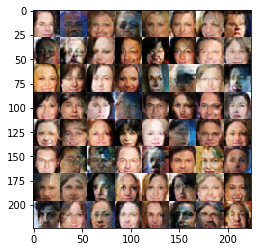

Epoch 1/1... Discriminator Loss: 0.9293... Generator Loss: 1.1804
Epoch 1/1... Discriminator Loss: 1.3229... Generator Loss: 0.5803
Epoch 1/1... Discriminator Loss: 1.0174... Generator Loss: 1.0812
Epoch 1/1... Discriminator Loss: 0.9381... Generator Loss: 1.1340
Epoch 1/1... Discriminator Loss: 1.7616... Generator Loss: 0.3312
Epoch 1/1... Discriminator Loss: 0.9981... Generator Loss: 0.9752
Epoch 1/1... Discriminator Loss: 1.1401... Generator Loss: 0.9354
Epoch 1/1... Discriminator Loss: 1.2542... Generator Loss: 1.1012
Epoch 1/1... Discriminator Loss: 1.0290... Generator Loss: 1.2448
Epoch 1/1... Discriminator Loss: 0.9699... Generator Loss: 1.3208


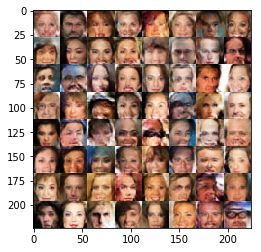

Epoch 1/1... Discriminator Loss: 1.1609... Generator Loss: 1.2603
Epoch 1/1... Discriminator Loss: 1.0349... Generator Loss: 0.9592
Epoch 1/1... Discriminator Loss: 1.2170... Generator Loss: 0.7031
Epoch 1/1... Discriminator Loss: 1.0297... Generator Loss: 1.0675
Epoch 1/1... Discriminator Loss: 1.2491... Generator Loss: 0.6690
Epoch 1/1... Discriminator Loss: 1.1448... Generator Loss: 0.8293
Epoch 1/1... Discriminator Loss: 1.1069... Generator Loss: 0.8206
Epoch 1/1... Discriminator Loss: 1.1930... Generator Loss: 0.7175
Epoch 1/1... Discriminator Loss: 1.3239... Generator Loss: 0.6731
Epoch 1/1... Discriminator Loss: 1.0505... Generator Loss: 0.9434


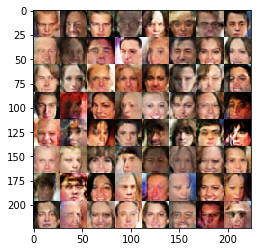

Epoch 1/1... Discriminator Loss: 0.9264... Generator Loss: 0.9810
Epoch 1/1... Discriminator Loss: 1.1505... Generator Loss: 0.9532
Epoch 1/1... Discriminator Loss: 1.0148... Generator Loss: 0.9709
Epoch 1/1... Discriminator Loss: 1.0491... Generator Loss: 1.0256
Epoch 1/1... Discriminator Loss: 1.2319... Generator Loss: 0.8289
Epoch 1/1... Discriminator Loss: 1.1124... Generator Loss: 0.8849
Epoch 1/1... Discriminator Loss: 1.3424... Generator Loss: 0.4930
Epoch 1/1... Discriminator Loss: 1.0979... Generator Loss: 0.9130
Epoch 1/1... Discriminator Loss: 1.6306... Generator Loss: 0.3839
Epoch 1/1... Discriminator Loss: 1.1490... Generator Loss: 0.7640


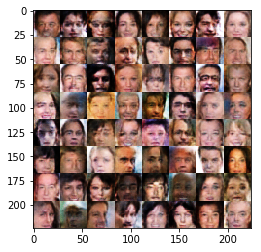

Epoch 1/1... Discriminator Loss: 1.3307... Generator Loss: 0.6455
Epoch 1/1... Discriminator Loss: 1.1412... Generator Loss: 0.9151
Epoch 1/1... Discriminator Loss: 1.0400... Generator Loss: 1.0652
Epoch 1/1... Discriminator Loss: 1.4138... Generator Loss: 0.4949
Epoch 1/1... Discriminator Loss: 1.0904... Generator Loss: 0.9093
Epoch 1/1... Discriminator Loss: 0.9305... Generator Loss: 1.2742
Epoch 1/1... Discriminator Loss: 1.2400... Generator Loss: 0.6673
Epoch 1/1... Discriminator Loss: 1.3600... Generator Loss: 0.5246
Epoch 1/1... Discriminator Loss: 1.1093... Generator Loss: 0.7711
Epoch 1/1... Discriminator Loss: 0.9351... Generator Loss: 1.2564


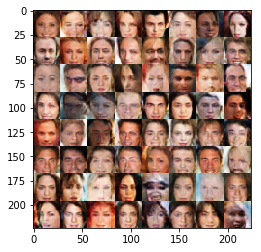

Epoch 1/1... Discriminator Loss: 1.2873... Generator Loss: 0.6192
Epoch 1/1... Discriminator Loss: 1.0953... Generator Loss: 0.8252
Epoch 1/1... Discriminator Loss: 1.1638... Generator Loss: 0.7216
Epoch 1/1... Discriminator Loss: 1.1829... Generator Loss: 1.1600
Epoch 1/1... Discriminator Loss: 1.2361... Generator Loss: 0.9472
Epoch 1/1... Discriminator Loss: 0.9712... Generator Loss: 1.8167
Epoch 1/1... Discriminator Loss: 0.8907... Generator Loss: 1.0859
Epoch 1/1... Discriminator Loss: 1.1763... Generator Loss: 0.7559
Epoch 1/1... Discriminator Loss: 1.2341... Generator Loss: 0.7002
Epoch 1/1... Discriminator Loss: 1.2779... Generator Loss: 0.9329


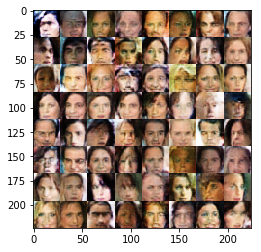

Epoch 1/1... Discriminator Loss: 1.2046... Generator Loss: 0.6069
Epoch 1/1... Discriminator Loss: 1.0035... Generator Loss: 1.1166
Epoch 1/1... Discriminator Loss: 1.0320... Generator Loss: 1.3666
Epoch 1/1... Discriminator Loss: 1.0393... Generator Loss: 1.0265
Epoch 1/1... Discriminator Loss: 1.1807... Generator Loss: 0.7315
Epoch 1/1... Discriminator Loss: 1.2324... Generator Loss: 0.7078


In [ ]:
batch_size = 32
z_dim = 128
learning_rate = 0.0002
beta1 = 0.4

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.